# Case Study - Complex Network Analysis

## Name    : Sujatha S
## Roll No : AA.SC.P2MCA2107441

### Dataset 
- #### Dataset used contains details of Quaker community.
- #### Quakers are members of the Religious Society of Friends, a Christian movement founded by George Fox c. 1650 and devoted to peaceful principles. 
- #### There are two files that together constitute the network dataset.
- #### The file quakers_nodelist.csv is a list of early modern Quakers(nodes) and the file quakers_edgelist.csv is a list of relationships between those Quakers(edges).
- #### Each Quaker node also has a number of associated attributes including historical significance, gender, birth/death dates, and SDFB ID—a unique numerical identifier that will enable you to cross-reference nodes in this dataset with the original Six Degrees of Francis Bacon dataset.
- #### The dataset is undirected. 

#### Loading necessary libraries

In [4]:
import csv
from operator import itemgetter
import networkx as nx
from networkx.algorithms import community 
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

#### Loading the dataset

In [5]:
with open('quakers_nodelist.csv', 'r') as nodecsv:
    nodereader = csv.reader(nodecsv) 
    nodes = [n for n in nodereader][1:]

node_names = [n[0] for n in nodes] 

with open('quakers_edgelist.csv', 'r') as edgecsv: 
    edgereader = csv.reader(edgecsv) 
    edges = [tuple(e) for e in edgereader][1:] 

In [6]:
nodes

[['Joseph Wyeth', 'religious writer', 'male', '1663', '1731', '10013191'],
 ['Alexander Skene of Newtyle',
  'local politician and author',
  'male',
  '1621',
  '1694',
  '10011149'],
 ['James Logan',
  'colonial official and scholar',
  'male',
  '1674',
  '1751',
  '10007567'],
 ['Dorcas Erbery', 'Quaker preacher', 'female', '1656', '1659', '10003983'],
 ['Lilias Skene',
  'Quaker preacher and poet',
  'male',
  '1626',
  '1697',
  '10011152'],
 ['William Mucklow', 'religious writer', 'male', '1630', '1713', '10008595'],
 ['Thomas Salthouse',
  'Quaker preacher and writer',
  'male',
  '1630',
  '1691',
  '10010643'],
 ['William Dewsbury', 'Quaker activist', 'male', '1621', '1688', '10003478'],
 ['John Audland', 'Quaker preacher', 'male', '1630', '1664', '10000411'],
 ['Richard Claridge',
  'Quaker minister and schoolmaster',
  'male',
  '1649',
  '1723',
  '10002469'],
 ['William Bradford', 'printer', 'male', '1663', '1752', '10001445'],
 ['Fettiplace Bellers',
  'philosophical wri

In [7]:
edges

[('George Keith', 'Robert Barclay'),
 ('George Keith', 'Benjamin Furly'),
 ('George Keith', 'Anne Conway Viscountess Conway and Killultagh'),
 ('George Keith', 'Franciscus Mercurius van Helmont'),
 ('George Keith', 'William Penn'),
 ('George Keith', 'George Fox'),
 ('George Keith', 'George Whitehead'),
 ('George Keith', 'William Bradford'),
 ('James Parnel', 'Benjamin Furly'),
 ('James Parnel', 'Stephen Crisp'),
 ('Peter Collinson', 'John Bartram'),
 ('Peter Collinson', 'James Logan'),
 ('Joseph Wyeth', 'Thomas Ellwood'),
 ('Alexander Skene of Newtyle', 'Lilias Skene'),
 ('Dorcas Erbery', 'James Nayler'),
 ('William Mucklow', 'George Fox'),
 ('Franciscus Mercurius van Helmont', 'Benjamin Furly'),
 ('William Dewsbury', 'Edward Burrough'),
 ('William Dewsbury', 'George Fox'),
 ('William Dewsbury', 'John Crook'),
 ('John Audland', 'John Camm'),
 ('John Audland', 'Francis Howgill'),
 ('John Audland', 'Edward Pyott'),
 ('John Audland', 'Charles Marshall'),
 ('John Audland', 'George Fox'),
 

In [8]:
print(len(node_names))
print(len(edges))


119
174


#### Creating graph

In [9]:
G = nx.Graph()
G.add_nodes_from(node_names)
G.add_edges_from(edges)

In [10]:
nx.info(G)

'Graph with 119 nodes and 174 edges'

#### Adding attributes

In [11]:
hist_sig_dict = {}
gender_dict = {}
birth_dict = {}
death_dict = {}
id_dict = {}

In [12]:
for node in nodes: 
    hist_sig_dict[node[0]] = node[1]
    gender_dict[node[0]] = node[2]
    birth_dict[node[0]] = node[3]
    death_dict[node[0]] = node[4]
    id_dict[node[0]] = node[5]

In [13]:
# Setting node attributes
nx.set_node_attributes(G, hist_sig_dict, 'historical_significance')
nx.set_node_attributes(G, gender_dict, 'gender')
nx.set_node_attributes(G, birth_dict, 'birth_year')
nx.set_node_attributes(G, death_dict, 'death_year')
nx.set_node_attributes(G, id_dict, 'sdfb_id')

In [14]:
for n in G.nodes():
    print(n, G.nodes[n]['birth_year']) 

Joseph Wyeth 1663
Alexander Skene of Newtyle 1621
James Logan 1674
Dorcas Erbery 1656
Lilias Skene 1626
William Mucklow 1630
Thomas Salthouse 1630
William Dewsbury 1621
John Audland 1630
Richard Claridge 1649
William Bradford 1663
Fettiplace Bellers 1687
John Bellers 1654
Isabel Yeamans 1637
George Fox the younger 1551
George Fox 1624
John Stubbs 1618
Anne Camm 1627
John Camm 1605
Thomas Camm 1640
Katharine Evans 1618
Lydia Lancaster 1683
Samuel Clarridge 1631
Thomas Lower 1633
Gervase Benson 1569
Stephen Crisp 1628
James Claypoole 1634
Thomas Holme 1626
John Freame 1665
John Swinton 1620
William Mead 1627
Henry Pickworth 1673
John Crook 1616
Gilbert Latey 1626
Ellis Hookes 1635
Joseph Besse 1683
James Nayler 1618
Elizabeth Hooten 1562
George Whitehead 1637
John Whitehead 1630
William Crouch 1628
Benjamin Furly 1636
Silvanus Bevan 1691
Robert Rich 1607
John Whiting 1656
Christopher Taylor 1614
Thomas Lawson 1630
Richard Farnworth 1630
William Coddington 1601
Thomas Taylor 1617
Richard 

- ### Query 1
-> #### How closely knit is this Quakers network?


In [15]:
density = nx.density(G)
print("Network density:", density)

Network density: 0.02478279447372169


- #### Network density is the ratio of actual edges in the network to all possible edges in the network.Network density gives us an idea of how closely knit our network is.
- #### The graph is not a very dense network 

In [16]:
from pyvis.network import Network
nt = Network(notebook=True)
nt.from_nx(G)
nt.show('nx.html')

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


- #### Find the shortest path between :
> a) Margaret Fell and George Whitehead<br>
 b) William Mucklow and Peter Collinson

In [17]:
fell_whitehead_path = nx.shortest_path(G, source="Margaret Fell", target="George Whitehead")

print(" Shortest path between Fell and Whitehead:\n", fell_whitehead_path)

 Shortest path between Fell and Whitehead:
 ['Margaret Fell', 'George Fox', 'George Whitehead']


In [18]:
mucklow_collinson_path = nx.shortest_path(G, source="William Mucklow", target="Peter Collinson")

print(" Shortest path between Mucklow and Collinson:\n", mucklow_collinson_path)

 Shortest path between Mucklow and Collinson:
 ['William Mucklow', 'George Fox', 'William Penn', 'James Logan', 'Peter Collinson']


- ### Query 2 
- #### Who has the most connections amongst each other in this network?

In [71]:
degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
print("Top 5 connected people in this network")
for d in sorted_degree[:5]:
    print(d)

Top 5 connected people in this network
('George Fox', 22)
('William Penn', 18)
('James Nayler', 16)
('George Whitehead', 13)
('Margaret Fell', 13)


In [72]:
print("\n George Fox : ", G.nodes['George Fox']['historical_significance'])
print("\n William Penn : ", G.nodes['William Penn']['historical_significance'])
print("\n James Nayler : ", G.nodes['James Nayler']['historical_significance'])
print("\n George Whitehead : ", G.nodes['George Whitehead']['historical_significance'])
print("\n Margaret Fell : ", G.nodes['Margaret Fell']['historical_significance'])


 George Fox :   a founder of the Religious Society of Friends (Quakers)

 William Penn :  Quaker leader and founder of Pennsylvania

 James Nayler :  Quaker preacher and writer

 George Whitehead :  Quaker leader and writer

 Margaret Fell :  Quaker leader


In [57]:
def draw(G, pos, measures, measure_name):
    fig, ax = plt.subplots(figsize=(40,40))         

    nodes = nx.draw_networkx_nodes(G, pos,node_size=450, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys(),ax=ax)
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))
    labels = nx.draw_networkx_labels(G, pos, font_size=20)

    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [64]:
pos = nx.random_layout(G)

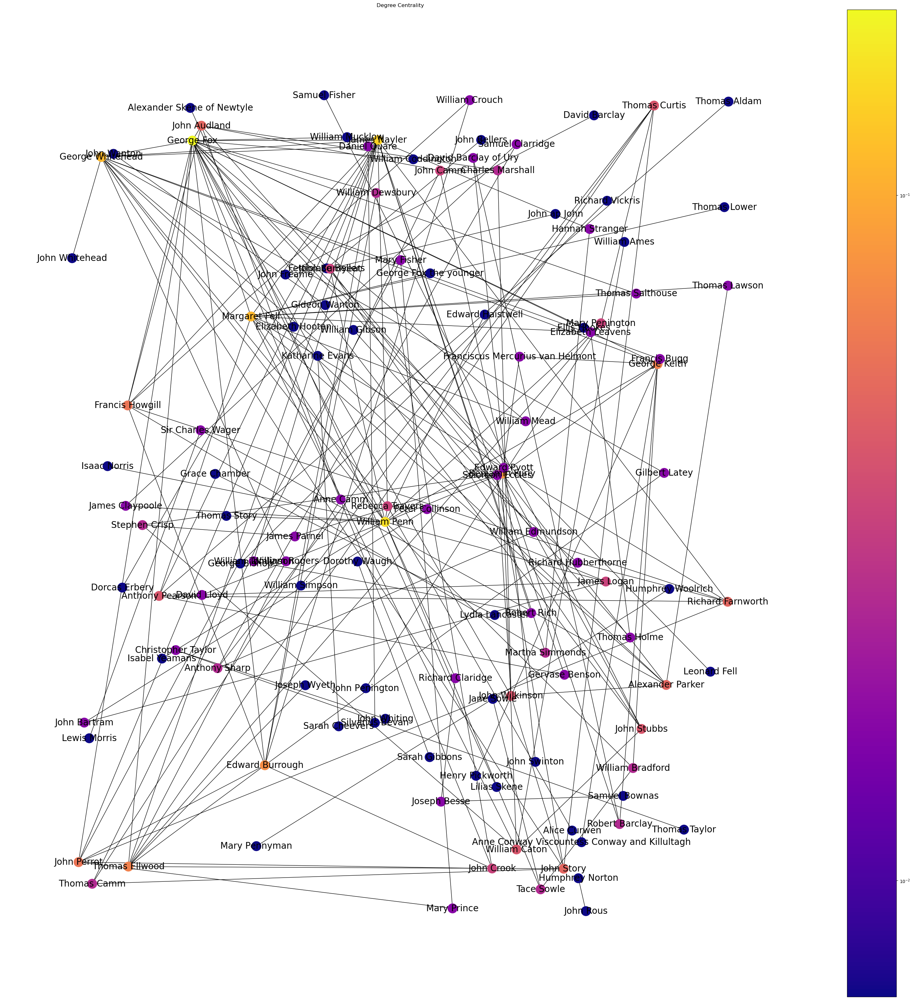

In [65]:
draw(G, pos, nx.degree_centrality(G), 'Degree Centrality')


- ### Query 3 
- #### Who are the gatekeepers in this network?
- #### Gatekeepers act as middlemen for flow of communication

In [66]:
betweenness_dict = nx.betweenness_centrality(G) 

# Assign to an attribute in the network
nx.set_node_attributes(G, betweenness_dict, 'betweenness')


In [67]:
sorted_betweenness = sorted(betweenness_dict.items(), key=itemgetter(1), reverse=True)

print("Top 5 nodes by betweenness centrality:")
for b in sorted_betweenness[:5]:
    print(b)

Top 5 nodes by betweenness centrality:
('William Penn', 0.23999456006192205)
('George Fox', 0.23683257726065216)
('George Whitehead', 0.12632024847366005)
('Margaret Fell', 0.12106792237170329)
('James Nayler', 0.10446026280446098)


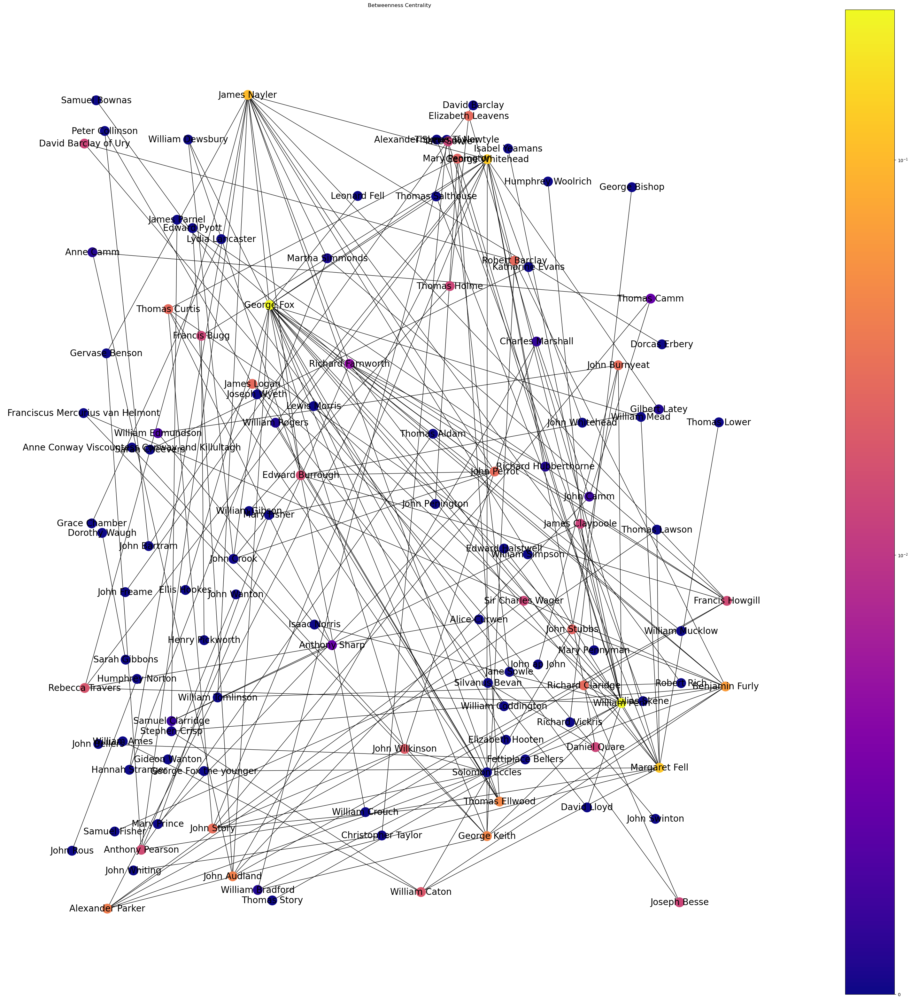

In [74]:
pos=nx.random_layout(G)
draw(G, pos, betweenness_dict, 'Betweenness Centrality')


- ### Query 4
- #### Who is the most influential person in this netwok?
- #### A person is important if he/she is linked to by other important persons.

In [101]:
eigenvector_dict = nx.eigenvector_centrality(G) 

# Assign to an attribute in the network
nx.set_node_attributes(G, eigenvector_dict, 'eigenvector')

In [102]:
sorted_eigen = sorted(eigenvector_dict.items(), key=itemgetter(1), reverse=True)

print("Top 5 nodes by eigenvector centrality:")
for b in sorted_eigen[:5]:
    print(b)

Top 5 nodes by eigenvector centrality:
('George Fox', 0.44917507108599225)
('James Nayler', 0.3352974100447867)
('William Penn', 0.27032201153998675)
('Margaret Fell', 0.253170949905681)
('George Whitehead', 0.2497455334914196)


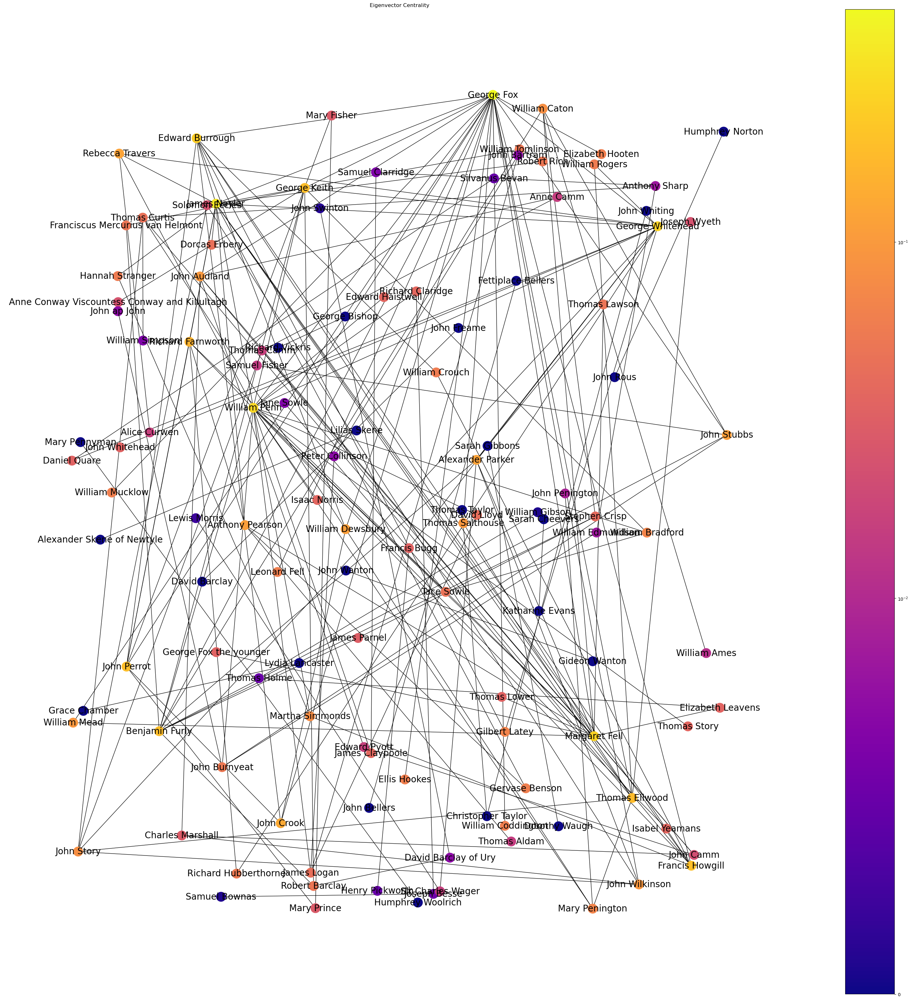

In [103]:
pos=nx.random_layout(G)
draw(G, pos, eigenvector_dict, 'Eigenvector Centrality')


- ### Query 5
- #### How many communities can be detected in this network?

In [167]:
communities = community.girvan_newman(G)


In [168]:
node_groups = []
for com in next(communities):
    node_groups.append(list(com))

print(node_groups)
print('Total community count : ', len(node_groups))
color_map = []
for node in G:
    if node in node_groups[0]:
        color_map.append('teal')
    elif node in node_groups[1]:
        color_map.append('green')
    elif node in node_groups[2]:
        color_map.append('yellow')
    elif node in node_groups[3]:
        color_map.append('red')
    elif node in node_groups[4]:
        color_map.append('orange')
    elif node in node_groups[5]:
        color_map.append('cyan')
    elif node in node_groups[6]:
        color_map.append('magenta')
    elif node in node_groups[7]:
        color_map.append('gray')
    elif node in node_groups[8]:
        color_map.append('coral')
    elif node in node_groups[9]:
        color_map.append('aquamarine')
    elif node in node_groups[10]:
        color_map.append('peru')    
    elif node in node_groups[11]:
        color_map.append('blue')
    else: 
        color_map.append('hotpink')  
        


[['William Rogers', 'Margaret Fell', 'George Whitehead', 'Samuel Fisher', 'Charles Marshall', 'William Mucklow', 'Mary Prince', 'John Stubbs', 'David Barclay of Ury', 'Sir Charles Wager', 'William Gibson', 'Lewis Morris', 'William Caton', 'George Fox the younger', 'Mary Fisher', 'Hannah Stranger', 'Robert Barclay', 'John Wilkinson', 'John Penington', 'Edward Burrough', 'Dorcas Erbery', 'William Ames', 'Thomas Holme', 'Joseph Wyeth', 'Robert Rich', 'Rebecca Travers', 'Anne Conway Viscountess Conway and Killultagh', 'Thomas Lower', 'Henry Pickworth', 'James Parnel', 'Benjamin Furly', 'Elizabeth Leavens', 'George Keith', 'Francis Bugg', 'George Fox', 'Stephen Crisp', 'Thomas Curtis', 'Gervase Benson', 'Franciscus Mercurius van Helmont', 'Edward Pyott', 'John Crook', 'William Simpson', 'William Coddington', 'Richard Hubberthorne', 'Thomas Salthouse', 'Thomas Lawson', 'Elizabeth Hooten', 'Daniel Quare', 'Silvanus Bevan', 'William Crouch', 'William Dewsbury', 'William Tomlinson', 'Alexander 

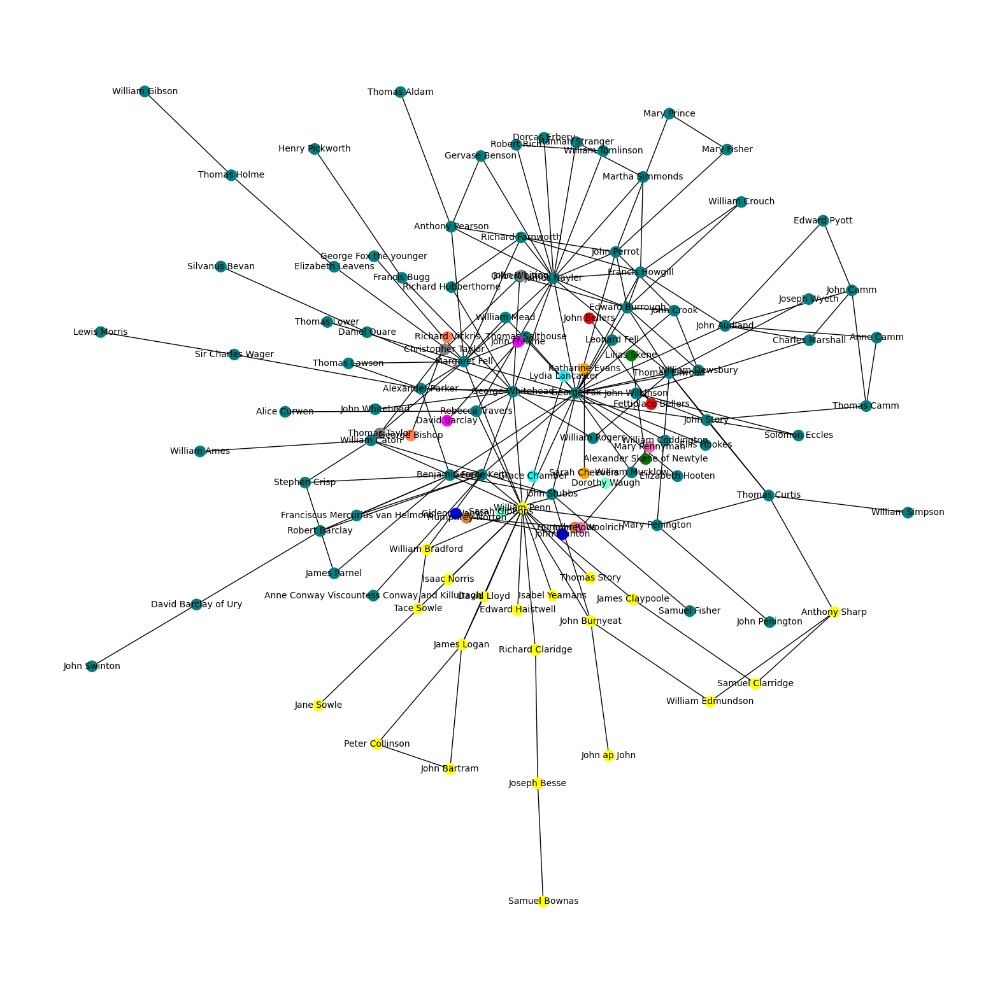

In [169]:
fig, ax = plt.subplots(figsize=(20,20))         
pos=nx.kamada_kawai_layout(G)
nx.draw(G,pos,node_size=150,font_size=10, node_color=color_map, with_labels=True )
plt.show()

- #### There are 2 major communities:  Teal group & Yellow group
- #### Total community count is 13
- #### Teal group have occupations directly related to the Quaker movement (like founder, missionary etc). They are the religious class.
- #### Yellow group are mostly Quaker leaders, ministers etc. They are the political class.

### HITS Algorithm(Hyperlink Induced Topic Search )
- #### Hyperlink Induced Topic Search (HITS) is an algorithm used in link analysis.
- #### HITS could discover and rank the webpages relevant for a particular search.
- #### The idea of this algorithm originated from the fact that an ideal website should link to other relevant sites and also being linked by other important sites.

In [176]:
class Node:
    def __init__(self, name):
        self.name = name
        self.children = []
        self.parents = []
        self.auth = 1.0
        self.hub = 1.0

In [177]:
def HITS_one_iter(graph):
    node_list = graph.nodes

    for node in node_list:
        node.update_auth()
    for node in node_list:
        node.update_hub()

    graph.normalize_auth_hub()

In [178]:
def update_auth(self):
    self.auth = sum(node.hub for node in self.parents)

def update_hub(self):
    self.hub = sum(node.auth for node in self.children)

In [179]:
def normalize_auth_hub(self):
    auth_sum = sum(node.auth for node in self.nodes)
    hub_sum = sum(node.hub for node in self.nodes)

    for node in self.nodes:
        node.auth /= auth_sum
        node.hub /= hub_sum

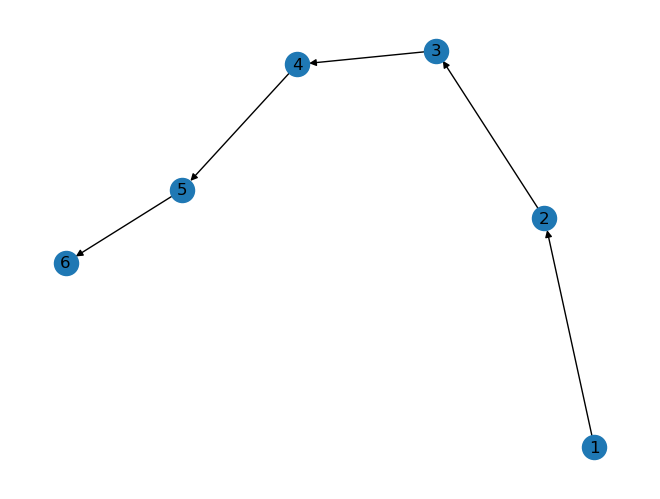

In [189]:
G1 = nx.DiGraph()


G1.add_edges_from([(1, 2), (2, 3), (3, 4), (4, 5), (5, 6)])
nx.draw(G1, with_labels=True)

In [190]:
HITS_one_iter(G1)

AttributeError: 'int' object has no attribute 'update_auth'